# Sanity check output

In [1]:
import os

os.chdir("../..")

In [2]:
!pwd

/Users/wiktorlazarski/Desktop/my_project/edge-aware-face-autoencoder


In [3]:
import torch

import face_autoencoder.reconstruction_pipeline as rec_pipeline
import scripts.training.data_loading as dl

import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (12, 10)
plt.rcParams["image.cmap"] = "gray"
plt.rcParams['savefig.facecolor'] = "white"

%load_ext autoreload
%autoreload 2

In [4]:
SANITY_CHECK_DSET_PATH = os.path.join(".", "data", "sanity_check", "train")

MODEL_PATH = os.path.join(".", "face_autoencoder", "model", "last.ckpt")

In [5]:
dset = dl.CelebAFaceAutoencoderDataset(dataset_root=SANITY_CHECK_DSET_PATH)

reconstruction_pipeline = rec_pipeline.VAEReconstructionPipeline(
    model_path=MODEL_PATH,
    nn_input_image_resolution=256,
)

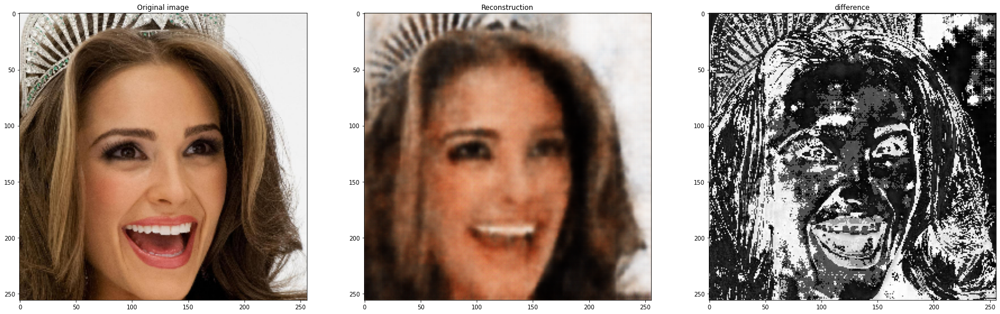

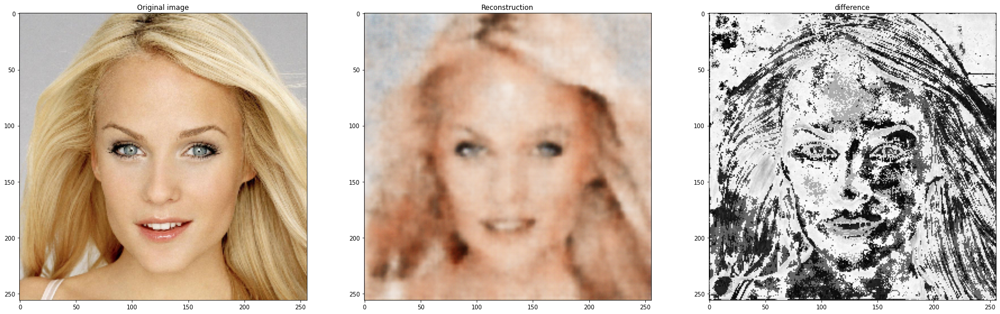

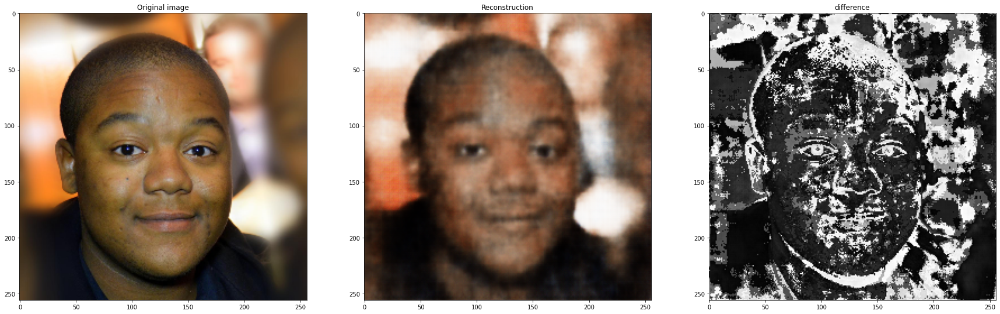

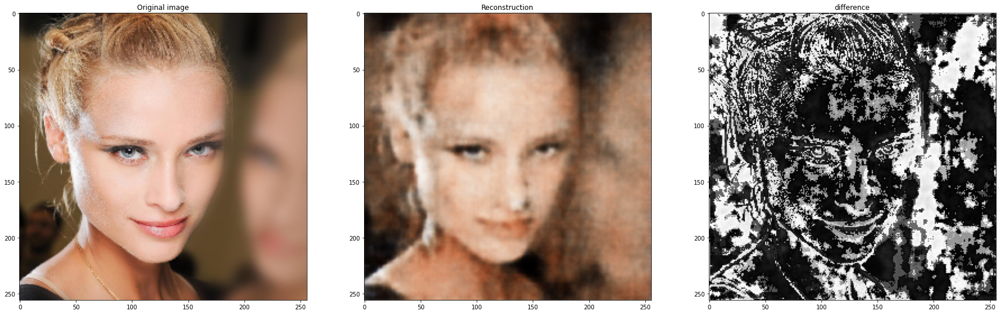

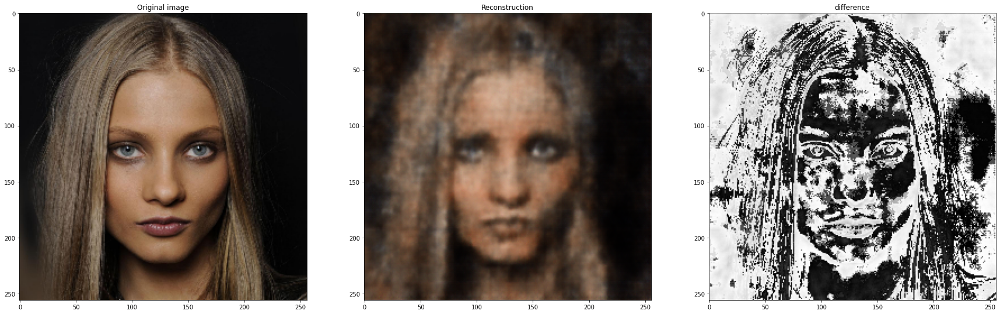

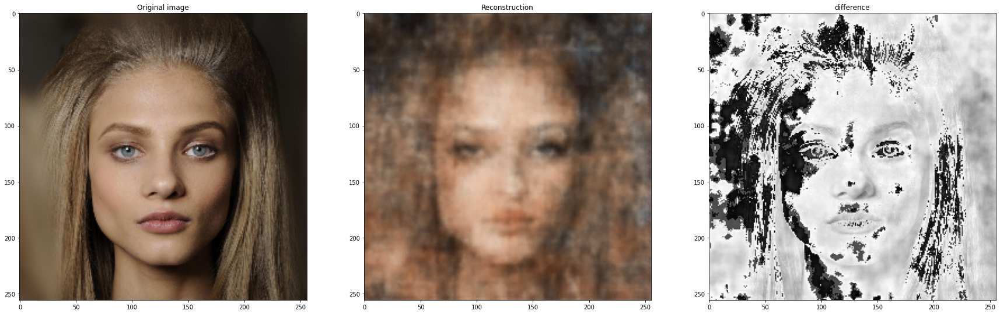

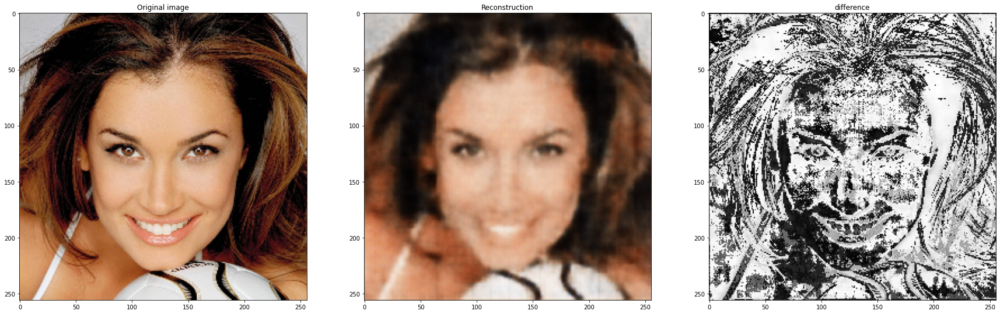

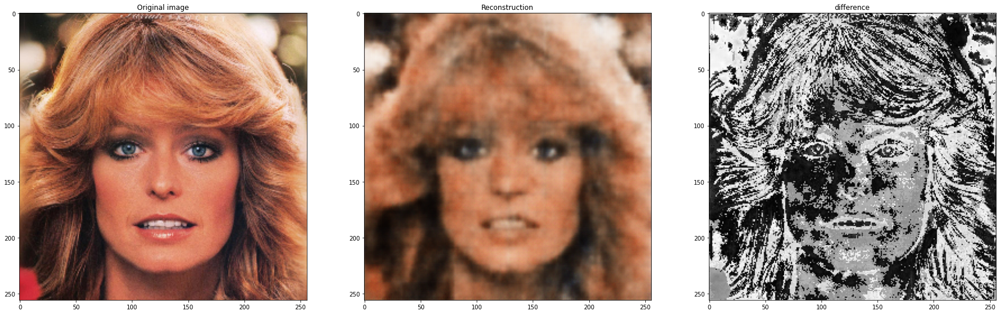

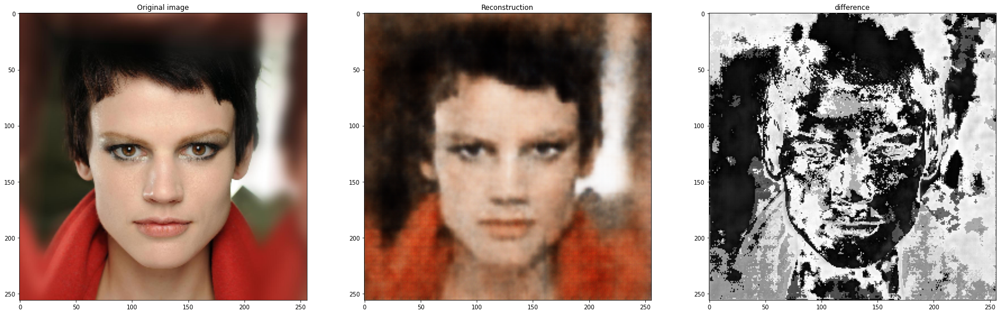

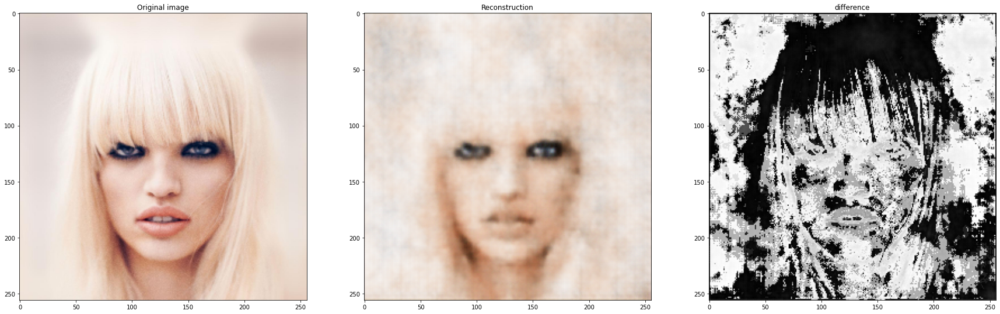

In [6]:
for i in range(10):
    img = dset[i]
    reconstruction = reconstruction_pipeline(img)

    f, a = plt.subplots(1, 3, figsize=(30, 10))

    resized_img = cv2.resize(img, (256, 256))

    a[0].imshow(resized_img)
    a[0].set_title("Original image")

    a[1].imshow(reconstruction)
    a[1].set_title("Reconstruction")

    diff_img = cv2.cvtColor(resized_img - reconstruction, cv2.COLOR_RGB2GRAY)

    a[2].imshow(diff_img, cmap="gray")
    a[2].set_title("difference")